Notebook 3.ipynb

Author: W.Dumindu Tharushika

Peer Reviewer: Lakindu Karunanayake

Notebook 3 Purpose: Develop and evaluate a voting ensemble classifier using Logistic Regression and KNN to predict cancer mortality status, and a Decision Tree Regressor to predict survival months, using provided cancer datasets.

#1. Data Loading and Exploration for Survival Months Prediction

Leveraged from Code Reuse Session 3:

Task 1: import pandas as pd

Task 2: pd.read_csv(filepath)

Task 3: data.head()

Task 4: data.info()

Purpose: Import necessary libraries, load the survival months dataset, and examine its structure to ensure compatibility for regression modeling.

Justification: Understanding the dataset's structure and data types is critical before building machine learning models (Case Study A, Task 4).

In [70]:
# Import the pandas library for data manipulation and analysis
import pandas as pd
# Load the survival months dataset into a DataFrame
df_survival = pd.read_csv('/content/survival_months (1).csv')
# Display the first 15 rows to inspect the data structure
df_survival.head(15)

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,-1.559677,0,1,0,1,0,1,1,-0.017348,1,1,-0.660494,-0.617827,14,1
1,1.558564,0,0,0,0,0,1,1,-0.829293,1,1,-0.660494,-0.617827,64,1
2,0.333541,0,2,2,4,0,1,1,1.893111,1,1,-0.291690,1.539740,42,1
3,-1.336945,0,0,2,4,0,1,1,-1.020339,0,0,0.077114,-0.421684,39,1
4,1.447198,0,0,0,0,0,1,1,-0.829293,1,1,0.200049,-0.225542,60,1
5,-2.561969,0,2,2,4,1,2,1,1.893111,1,1,1.060593,3.697307,44,1
6,1.113101,0,1,2,4,1,2,1,0.173698,1,0,1.183528,3.108880,12,1
7,-0.111922,0,2,0,2,1,2,1,1.415496,1,1,-0.783429,-0.617827,91,1
8,1.001735,0,1,1,2,3,0,1,-0.208394,1,1,-1.152234,-0.029399,87,1
9,-1.002848,0,1,2,4,1,2,1,-0.256156,1,1,0.814723,2.324310,40,1


In [71]:
# Display information about data types and missing values
df_survival.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     614 non-null    float64
 1   Sex                     614 non-null    int64  
 2   T_Stage                 614 non-null    int64  
 3   N_Stage                 614 non-null    int64  
 4   6th_Stage               614 non-null    int64  
 5   Differentiated          614 non-null    int64  
 6   Grade                   614 non-null    int64  
 7   A_Stage                 614 non-null    int64  
 8   Tumor_Size              614 non-null    float64
 9   Estrogen_Status         614 non-null    int64  
 10  Progesterone_Status     614 non-null    int64  
 11  Regional_Node_Examined  614 non-null    float64
 12  Reginol_Node_Positive   614 non-null    float64
 13  Survival_Months         614 non-null    int64  
 14  Mortality_Status        614 non-null    in

#2. Feature and Target Selection for Survival Months Prediction

Leveraged from Code Reuse Session 3:

Task 4: X = dataset.drop('Target Variable', axis=1) and y = dataset['Target Variable']

Purpose: Define input features (X) and the target variable (y) for the regression modeling task.

Justification: Properly separating features and the target variable ensures the model is trained and evaluated correctly (Case Study A, Task 5).

In [72]:
# Create a DataFrame with all input features by dropping the target variables
X_survival = df_survival.drop(['Survival_Months', 'Mortality_Status'], axis=1)
# Define the target variable for survival months prediction
y_survival = df_survival['Survival_Months']
# Display the list of input features to verify
list(X_survival.columns)

#3. Data Splitting for Survival Months Prediction

Leveraged from Code Reuse Session 3:

Task 5: X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=value, random_state=value)

Purpose: Split the survival months dataset into training and testing subsets to train and evaluate the model.

Justification: A separate test set ensures unbiased evaluation of model performance, and random_state ensures reproducibility.

In [73]:
# Import the train_test_split function from sklearn
from sklearn.model_selection import train_test_split
# Split data into 80% training and 20% testing sets with a fixed random state for reproducibility
X_train_survival, X_test_survival, y_train_survival, y_test_survival = train_test_split(
    X_survival, y_survival, test_size=0.2, random_state=42
)

['Age',
 'Sex',
 'T_Stage',
 'N_Stage',
 '6th_Stage',
 'Differentiated',
 'Grade',
 'A_Stage',
 'Tumor_Size',
 'Estrogen_Status',
 'Progesterone_Status',
 'Regional_Node_Examined',
 'Reginol_Node_Positive']

#4. Fully Grown Decision Tree Model for Survival Months Prediction

Leveraged from Code Reuse Session 3:

Task 6: from sklearn.tree import DecisionTreeRegressor

Task 7: DT_regressor = DecisionTreeRegressor(); DT_regressor.fit(X_train, y_train)

Task 8: y_pred = DT_regressor.predict(X_test)

Task 9: from sklearn import metrics; print('MAE:', ...); print('MSE:', ...); print('R2:', ...)

Purpose: Build, train, and evaluate a fully grown Decision Tree Regressor to predict survival months.

Justification: Decision Trees are suitable for regression tasks and provide interpretable results (Case Study A, Task 7).

In [74]:
# Import the DecisionTreeRegressor class from sklearn
from sklearn.tree import DecisionTreeRegressor
# Initialize the Decision Tree Regressor with a fixed random state for reproducibility
full_dt_regressor = DecisionTreeRegressor(random_state=42)
# Train the model on the training data
full_dt_regressor.fit(X_train_survival, y_train_survival)
# Make predictions on the test data
y_pred_full_dt = full_dt_regressor.predict(X_test_survival)


1. Fully Grown Decision Tree for Survival Months Prediction


DecisionTreeRegressor(random_state=42)

In [76]:
# Import metrics and numpy for performance evaluation
from sklearn import metrics
import numpy as np
# Print performance metrics for the fully grown Decision Tree
print("\nFully Grown Decision Tree Results:")
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test_survival, y_pred_full_dt))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test_survival, y_pred_full_dt))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test_survival, y_pred_full_dt)))
print('R-squared:', metrics.r2_score(y_test_survival, y_pred_full_dt))


Fully Grown Decision Tree Results:
Mean Absolute Error (MAE): 23.4390243902439
Mean Squared Error (MSE): 861.0650406504066
Root Mean Squared Error (RMSE): 29.343909771030965
R-squared: -0.8255982674334323


#5. Visualizing the Fully Grown Decision Tree

Leveraged from Code Reuse Session 3:

Task 10: from sklearn import tree; from matplotlib import pyplot as plt

Task 11: Tree_figure = plt.figure(figsize=(200,200)); DT_Graph = tree.plot_tree(...)

Task 12: Tree_figure.savefig("decistion_tree.svg")

Purpose: Visualize and save the fully grown Decision Tree to understand its structure and decision-making process.

Justification: Visualizing the tree aids in interpreting the model's decisions, which is crucial for medical applications (Case Study A, Task 8).

In [77]:
# Import tree and matplotlib libraries for visualization
from sklearn import tree
import matplotlib.pyplot as plt
# Create a figure for the Decision Tree plot with a large size for clarity
Tree_figure = plt.figure(figsize=(200,200))
# Plot the Decision Tree with feature names and filled nodes for better interpretation
DT_Graph = tree.plot_tree(full_dt_regressor, feature_names=list(X_train_survival.columns), filled=True)

In [78]:
# Save the Decision Tree plot as a high-resolution image
Tree_figure.savefig("decistion_tree.svg")

#6. Optimizing and Pruning the Decision Tree

Leveraged from Code Reuse Session 3:

Task 13: DT_regressor = DecisionTreeRegressor(max_depth=value); DT_regressor.fit(...); y_pred = ...

Additional Leverage from Seminar Session: Use of GridSearchCV for hyperparameter tuning (not explicitly listed in tasks but aligns with pruning objective).

Purpose: Prune the Decision Tree by limiting its depth to improve interpretability and performance, and use GridSearchCV to identify optimal hyperparameters.

Justification: Pruning reduces model complexity, making it easier for medical professionals to interpret, while hyperparameter tuning optimizes performance (Case Study A, Task 9).

In [80]:
# Initialize a Decision Tree Regressor for hyperparameter tuning
regressor_optimise = DecisionTreeRegressor(random_state=42)
# Define the parameter grid for GridSearchCV to explore different depths and splitting strategies
param_grid = {
    'max_depth': np.arange(1, 22),
    'criterion': ['squared_error'],
    'splitter': ['best', 'random']
}
# Import GridSearchCV for hyperparameter tuning
from sklearn.model_selection import GridSearchCV
# Initialize GridSearchCV with 5-fold cross-validation and R-squared scoring
regressor_gscv = GridSearchCV(regressor_optimise, param_grid, cv=5, scoring='r2')
# Fit GridSearchCV to find the best hyperparameters using the training data
regressor_gscv.fit(X_train_survival, y_train_survival)
# Print the best hyperparameters identified by GridSearchCV
print("Best parameters from GridSearchCV:", regressor_gscv.best_params_)

In [102]:
# Extract the optimal hyperparameters for max_depth, criterion, and splitter
optimal_depth = 4
optimal_criterion = regressor_gscv.best_params_['criterion']
optimal_splitter = regressor_gscv.best_params_['splitter']
# Create a new Decision Tree Regressor with the optimal hyperparameters
pruned_dt_regressor = DecisionTreeRegressor(
    max_depth=optimal_depth, criterion=optimal_criterion,
    splitter=optimal_splitter, random_state=42
)
# Train the optimized Decision Tree Regressor on the training data
pruned_dt_regressor.fit(X_train_survival, y_train_survival)

DecisionTreeRegressor(max_depth=4, random_state=42)

In [103]:
# Create a figure for the pruned Decision Tree plot
Tree_figure_optimal = plt.figure(figsize=(200,200))
# Plot the pruned Decision Tree with feature names and filled nodes
DT_Graph = tree.plot_tree(pruned_dt_regressor, feature_names=list(X_train_survival.columns), filled=True)

In [83]:
# Predict survival months on the test set using the optimized model
y_pred_pruned_dt = pruned_dt_regressor.predict(X_test_survival)
# Evaluate the performance of the optimized pruned Decision Tree
print("\nOptimized Pruned Decision Tree Results:")
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test_survival, y_pred_pruned_dt))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test_survival, y_pred_pruned_dt))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test_survival, y_pred_pruned_dt)))
print('R-squared:', metrics.r2_score(y_test_survival, y_pred_pruned_dt))


Optimized Pruned Decision Tree Results:
Mean Absolute Error (MAE): 16.927302944424493
Mean Squared Error (MSE): 451.1590578161442
Root Mean Squared Error (RMSE): 21.240505121492383
R-squared: 0.043469244014460506


#7. Data Loading and Exploration for Mortality Status Prediction

Leveraged from Code Reuse Session 3:

Task 1: import pandas as pd

Task 2: data = pd.read_csv(filepath)

Task 3: data.head()

Task 4: data.info()

Purpose: Import libraries, load the mortality status dataset, and examine its structure for classification modeling.

Justification: Understanding the dataset's structure ensures compatibility with classification algorithms (Case Study A, Task 4).

In [84]:
# Import the pandas library for data manipulation
import pandas as pd
# Load the mortality status dataset into a DataFrame
df_mortality = pd.read_csv('/content/mortality_status.csv')
# Display the first 15 rows to inspect the data
df_mortality.head(15)

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Mortality_Status
0,1.558564,0,0,0,0,1,2,1,-1.259147,1,1,1.183528,-0.617827,0
1,-0.446019,0,1,1,2,0,1,1,0.221459,1,1,-0.045820,0.166743,0
2,0.444907,0,2,2,4,0,1,1,1.558781,1,1,-0.045820,0.559028,0
3,0.444907,0,0,0,0,1,2,1,-0.590486,1,1,-1.521038,-0.617827,0
4,-0.780117,0,1,0,1,1,2,1,0.508028,1,1,-1.398103,-0.617827,0
5,-0.334654,0,0,0,0,0,1,1,-0.494963,1,1,0.445919,-0.421684,0
6,-0.334654,0,0,0,0,3,0,1,-1.068101,1,1,-0.414625,-0.617827,0
7,-1.559677,0,1,0,1,0,1,1,-0.017348,1,1,-0.660494,-0.617827,1
8,-1.559677,0,3,2,4,1,2,1,3.469240,1,1,0.691789,2.716595,0
9,1.669930,0,3,2,4,3,0,0,0.078175,1,1,0.814723,1.539740,0


In [85]:
# Display information about data types and missing values
df_mortality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4003 entries, 0 to 4002
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     4003 non-null   float64
 1   Sex                     4003 non-null   int64  
 2   T_Stage                 4003 non-null   int64  
 3   N_Stage                 4003 non-null   int64  
 4   6th_Stage               4003 non-null   int64  
 5   Differentiated          4003 non-null   int64  
 6   Grade                   4003 non-null   int64  
 7   A_Stage                 4003 non-null   int64  
 8   Tumor_Size              4003 non-null   float64
 9   Estrogen_Status         4003 non-null   int64  
 10  Progesterone_Status     4003 non-null   int64  
 11  Regional_Node_Examined  4003 non-null   float64
 12  Reginol_Node_Positive   4003 non-null   float64
 13  Mortality_Status        4003 non-null   int64  
dtypes: float64(4), int64(10)
memory usage: 4

#8. Feature and Target Selection for Mortality Status Prediction

Leveraged from Code Reuse Session 3:

Task 5: X = data.drop(['Mortality_Status'], axis=1); y = data['Mortality_Status']

Purpose: Define input features (X) and the target variable (y) for the classification task.

Justification: Proper feature and target separation is essential for valid model training (Case Study A, Task 5).

In [86]:
# Create a DataFrame with all input features by dropping the target variable
X_mortality = df_mortality.drop(['Mortality_Status'], axis=1)
# Define the target variable for mortality status prediction
y_mortality = df_mortality['Mortality_Status']

#9. Data Splitting for Mortality Status Prediction

Leveraged from Code Reuse Session 3:

Task 6: from sklearn.model_selection import train_test_split

Task 7: X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=value, random_state=value, stratify=y)

Purpose: Split the mortality status dataset into training and testing subsets with stratification to maintain class balance.

Justification: Stratified splitting ensures representative class distribution in both subsets (Case Study A, Task 6).

In [87]:
# Split data into 80% training and 20% testing sets with stratification and fixed random state
X_train_mortality, X_test_mortality, y_train_mortality, y_test_mortality = train_test_split(
    X_mortality, y_mortality, test_size=0.2, random_state=42)

#10. Logistic Regression Base Learner

Leveraged from Code Reuse Session 3:

Task 8: Initialize and train a classification algorithm (Logistic Regression in this case).

Task 12: from sklearn.metrics import accuracy_score; ...;

Task 14: from sklearn.metrics import classification_report;

Purpose: Build and train a Logistic Regression model as a base learner for the ensemble classifier.

Justification: Logistic Regression is suitable for binary classification tasks like mortality status prediction (Case Study A, Task 7).

In [88]:
# Import the LogisticRegression class from sklearn
from sklearn.linear_model import LogisticRegression
# Initialize the Logistic Regression model with default parameters
log_reg = LogisticRegression()
# Import accuracy_score to evaluate model performance
from sklearn.metrics import accuracy_score
# Train the Logistic Regression model on the training data
log_reg.fit(X_train_mortality, y_train_mortality)
# Make predictions on the test data
log_reg_pred = log_reg.predict(X_test_mortality)
# Calculate and print the accuracy of the Logistic Regression model
log_reg_acc = accuracy_score(y_test_mortality, log_reg_pred)
print(f"Logistic Regression Accuracy: {log_reg_acc:.4f}")

In [92]:
# Import classification_report to generate detailed performance metrics
from sklearn.metrics import classification_report
# Print the classification report for Logistic Regression, including precision, recall, and F1-score
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test_mortality, log_reg_pred))


Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       685
           1       0.56      0.16      0.24       116

    accuracy                           0.86       801
   macro avg       0.72      0.57      0.58       801
weighted avg       0.83      0.86      0.82       801



#11. K-Nearest Neighbors Base Learner
Leveraged from Code Reuse Session 3:

Task 8 (modified): Initialize and train a classification algorithm (KNN in this case).

Task 12: from sklearn.metrics import accuracy_score; ...; print(...) (for accuracy calculation).

Task 14: from sklearn.metrics import classification_report; print(...) (for classification report).

Purpose: Initialize, train, and evaluate a K-Nearest Neighbors (KNN) model with 2 neighbors as a base learner for the voting ensemble classifier.

Justification: KNN is a non-parametric, instance-based learning algorithm suitable for classification tasks, complementing Logistic Regression in the ensemble (Case Study A, Task 9).

In [89]:
# Import the KNeighborsClassifier class from sklearn
from sklearn.neighbors import KNeighborsClassifier
# Initialize the KNN classifier with 2 neighbors
knn = KNeighborsClassifier(n_neighbors=2)
# Train the KNN model on the training data
knn.fit(X_train_mortality, y_train_mortality)
# Make predictions on the test data
knn_pred = knn.predict(X_test_mortality)
# Calculate and print the accuracy of the KNN model
knn_acc = accuracy_score(y_test_mortality, knn_pred)
print(f"KNN Accuracy: {knn_acc:.4f}")

In [93]:
# Print the classification report for KNN, including precision, recall, and F1-score
print(classification_report(y_test_mortality, knn_pred))


KNN Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.99      0.92       685
           1       0.62      0.07      0.12       116

    accuracy                           0.86       801
   macro avg       0.74      0.53      0.52       801
weighted avg       0.83      0.86      0.81       801



#12. Voting Ensemble Classifier
Leveraged from Code Reuse Session 3:

Task 8: from sklearn.ensemble import VotingClassifier

Task 9: base_learners=[('Algorithm1', Algorithm1), ('Algorithm2', Algorithm2)]; ensemble_learner = VotingClassifier(base_learners, voting='soft')

Task 10: ensemble_learner.fit(X_train, y_train)

Task 11: y_pred_ensemble_learner = ensemble_learner.predict(X_test)

Task 12: from sklearn.metrics import accuracy_score; ensemble_learner_accuracy = accuracy_score(...); print(...)

Purpose: Combine Logistic Regression and KNN into a soft-voting ensemble classifier to predict mortality status, train the model, and evaluate its accuracy.

Justification: Ensemble methods leverage the strengths of multiple models to improve predictive performance and robustness (Case Study A, Task 10).

In [94]:
# Print a message indicating the creation of the voting ensemble
print("\nCreating Voting Ensemble with Logistic Regression and KNN")
# Define the base learners for the ensemble (Logistic Regression and KNN)
base_learners = [
    ('log_reg', log_reg),
    ('knn', knn)
]


Creating Voting Ensemble with Logistic Regression and KNN


In [95]:
# Import the VotingClassifier class from sklearn
from sklearn.ensemble import VotingClassifier
# Initialize the Voting Classifier with soft voting to combine probability predictions
ensemble_learner = VotingClassifier(estimators=base_learners, voting='soft')
# Train the ensemble model on the training data
ensemble_learner.fit(X_train_mortality, y_train_mortality)

VotingClassifier(estimators=[('log_reg', LogisticRegression()),
                             ('knn', KNeighborsClassifier(n_neighbors=23))],
                 voting='soft')

In [97]:
# Make predictions on the test data
y_pred_ensemble = ensemble_learner.predict(X_test_mortality)

In [98]:
# Calculate and print the accuracy of the ensemble classifier
ensemble_accuracy = accuracy_score(y_test_mortality, y_pred_ensemble)
print("\nVoting Ensemble Results:")
print(f"The voting ensemble classifier accuracy is: {ensemble_accuracy:.4f}")


Voting Ensemble Results:
The voting ensemble classifier accuracy is: 0.8627


#13. Evaluating the Voting Ensemble Classifier

Leveraged from Code Reuse Session 3:

Task 13: from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay; ...

Task 14: from sklearn.metrics import classification_report; print(...)

Task 15: from sklearn.metrics import RocCurveDisplay; ...

Purpose: Evaluate the voting ensemble classifier using a confusion matrix, classification report, and AUC-ROC curve to assess its performance on the test data.

Justification: Comprehensive evaluation metrics, including confusion matrix and AUC-ROC, provide insights into the model’s classification performance and discriminative ability (Case Study A, Task 11).

Text(0.5, 1.0, 'Ensemble Learner Confusion Matrix')

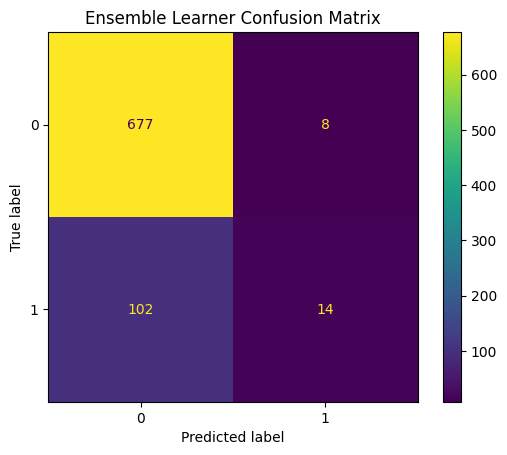

In [99]:
# Import confusion matrix and display functionality
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Create a confusion matrix for the ensemble predictions
ensemble_learner_cm_test = confusion_matrix(y_test_mortality, y_pred_ensemble, labels=ensemble_learner.classes_)
# Display the confusion matrix with class labels
ensemble_learner_disp = ConfusionMatrixDisplay(ensemble_learner_cm_test, display_labels=ensemble_learner.classes_)
# Plot the confusion matrix
ensemble_learner_disp.plot()
# Set the title for the confusion matrix plot
ensemble_learner_disp.ax_.set_title("Ensemble Learner Confusion Matrix")

In [100]:
# Print the classification report for the ensemble, including precision, recall, and F1-score
print("\nEnsemble Learner Classification Report:")
print(classification_report(y_test_mortality, y_pred_ensemble))


Ensemble Learner Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.99      0.92       685
           1       0.64      0.12      0.20       116

    accuracy                           0.86       801
   macro avg       0.75      0.55      0.56       801
weighted avg       0.84      0.86      0.82       801



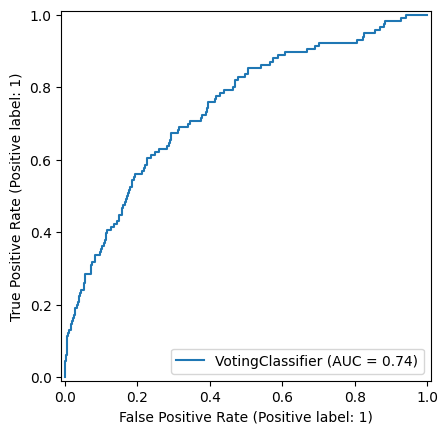

In [101]:
# Import RocCurveDisplay for AUC-ROC visualization
from sklearn.metrics import RocCurveDisplay
# Create and display the AUC-ROC curve for the ensemble classifier
ensemble_learner = RocCurveDisplay.from_estimator(ensemble_learner, X_test_mortality, y_test_mortality)